In [1]:
import pandas as pd

/share/python-virtual-environments/ciona_behaviour-v2/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
import numpy as np

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from openTSNE import TSNE

# basic

In [5]:
df_wv = pd.read_pickle('/data/temp/athira/speed_array_for_tsne_testing.pickle')

In [6]:
df_wv.shape

(3948425, 27)

In [22]:
df_wv_samples = df_wv.sample(200000)

In [37]:
df_wv_samples.index

Int64Index([5519156, 1875157, 1104935, 6358171,  371452, 3527038, 5712215,
            3377759, 4519508, 6597916,
            ...
            5668742, 3371762, 4097877, 3890583, 1437413, 3207603, 2735098,
            4312415, 5324952, 4454841],
           dtype='int64', length=200000)

In [23]:
df_wv_samples.shape

(200000, 27)

In [24]:
test_tsne = TSNE(n_jobs=50, perplexity = 1000, exaggeration = 2)
test_tsne = test_tsne.fit(df_wv_samples.values)

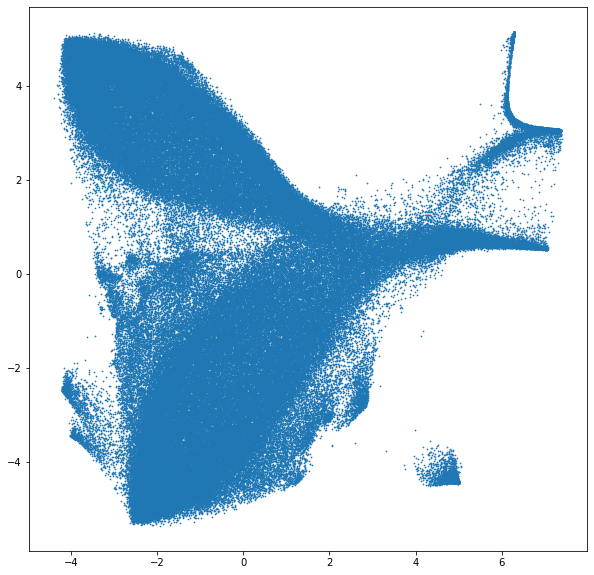

In [25]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(test_tsne[:,0], test_tsne[:,1], s=0.5)

## Optimixing TSNE results

In [26]:
from openTSNE import TSNEEmbedding, affinity, initialization
from openTSNE import initialization

### Stage 1

In [27]:
%%time
affinities_annealing = affinity.PerplexityBasedNN(
    df_wv_samples.values,
    perplexity= 500,
    metric="euclidean",
    n_jobs= 46,
    random_state=3,
    method = 'exact'
)

CPU times: user 10h 11min, sys: 44.3 s, total: 10h 11min 44s
Wall time: 14min 49s


In [28]:
%time init = initialization.pca(df_wv_samples.values, random_state=42)

CPU times: user 445 ms, sys: 7.99 ms, total: 453 ms
Wall time: 452 ms


In [29]:
embedding = TSNEEmbedding(
    init,
    affinities_annealing,
    negative_gradient_method="fft",
    n_jobs= 46,
    
)

In [30]:
%%time 
embedding1 = embedding.optimize(n_iter=250, exaggeration=12, momentum=0.5)

CPU times: user 47min 26s, sys: 2.07 s, total: 47min 28s
Wall time: 1min 9s


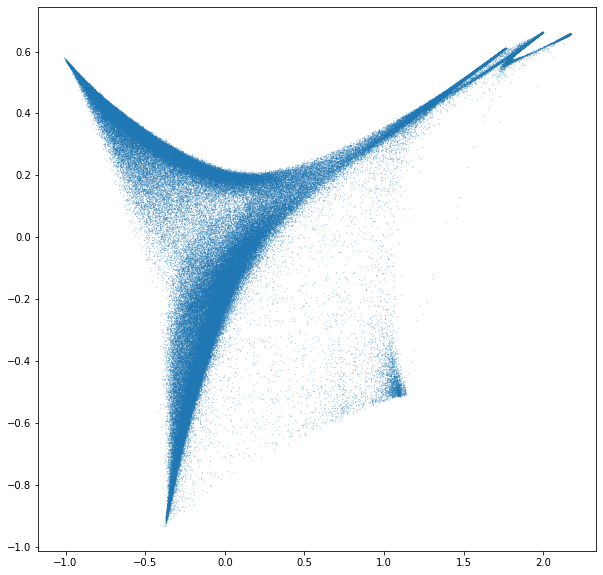

In [31]:
fig, axes = plt.subplots(1,1, figsize = (10,10))

axes.scatter(embedding1[:,0], embedding1[:,1], s = 0.05, alpha =0.5)

In [32]:
%time embedding2 = embedding1.optimize(n_iter=750, exaggeration=1, momentum=0.8)

CPU times: user 2h 59min 8s, sys: 4.81 s, total: 2h 59min 13s
Wall time: 4min 29s


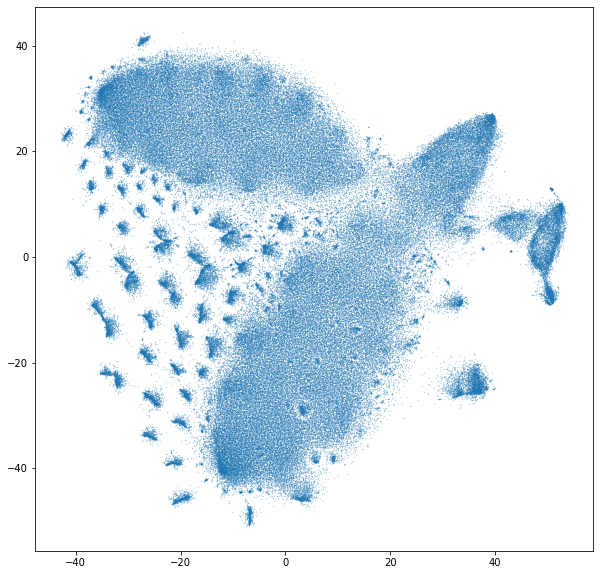

In [33]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5)

In [109]:
%time affinities_annealing.set_perplexity(200)

CPU times: user 1min 7s, sys: 1.44 s, total: 1min 8s
Wall time: 7.85 s


In [112]:
%time embedding3 = embedding2.optimize(n_iter=500, momentum=0.8, exaggeration=1.5)

CPU times: user 45min 34s, sys: 3.13 s, total: 45min 37s
Wall time: 1min 21s


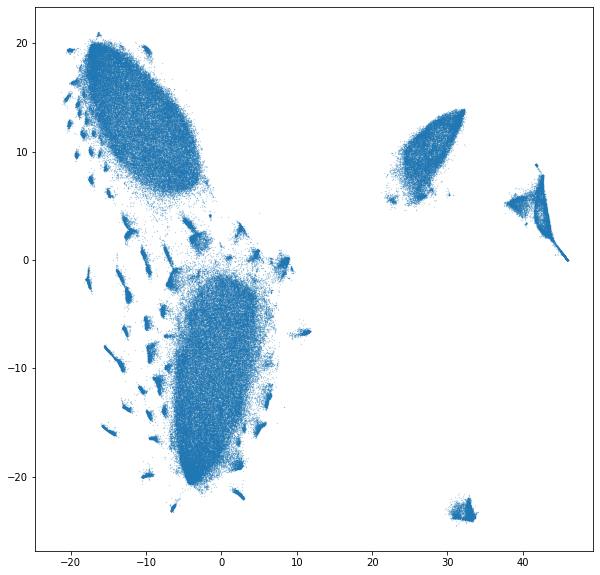

In [113]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5)

# Checking

In [38]:
sampled_ind = df_wv_samples.index

In [39]:
df_speeds = pd.read_pickle('/data/temp/athira/speed_array_for_tsne_testing.pickle')
df_speeds.columns

Index(['speed_NT', 'speed_DH1', 'speed_DH2', 'speed_DNP', 'speed_DTP1',
       'speed_DTP2', 'speed_DTP3', 'speed_DTP4', 'speed_DTP5', 'speed_DTP6',
       'speed_DTP7', 'speed_DTP8', 'speed_DTP9', 'speed_DTP10', 'speed_TT',
       'speed_VTP10', 'speed_VTP9', 'speed_VTP8', 'speed_VTP7', 'speed_VTP6',
       'speed_VTP5', 'speed_VTP4', 'speed_VTP3', 'speed_VTP2', 'speed_VTP1',
       'speed_VNP', 'speed_MOUTH'],
      dtype='object')

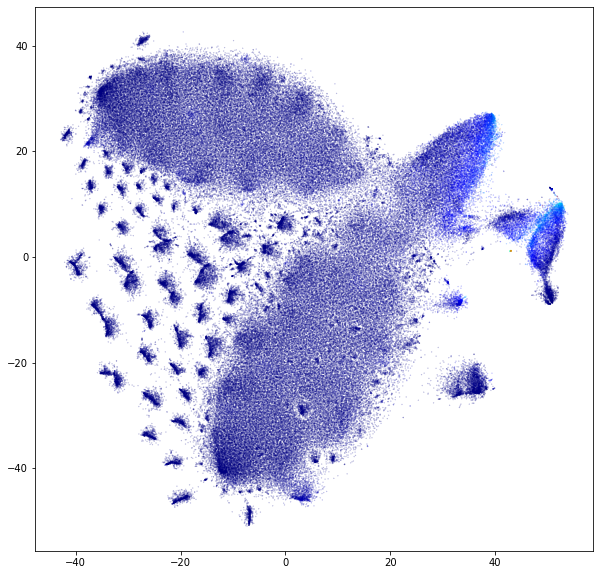

In [46]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = df_speeds.loc[df_wv_samples.index]['speed_NT'], s = 0.05, alpha =0.5, cmap='jet')

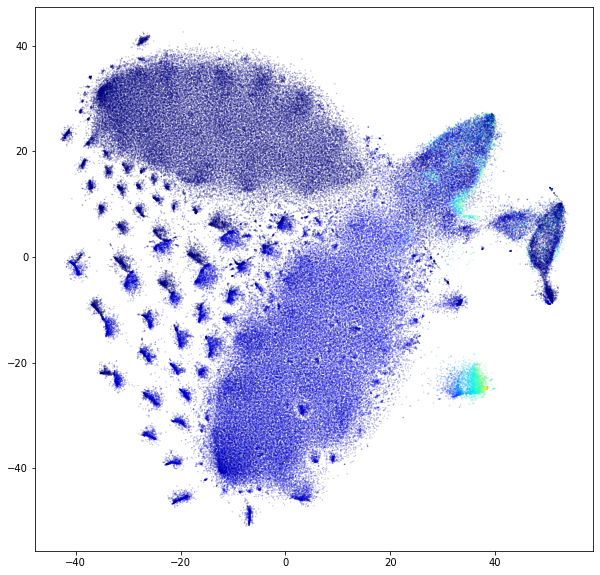

In [47]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = df_speeds.loc[df_wv_samples.index]['speed_MOUTH'], s = 0.05, alpha =0.5, cmap='jet')

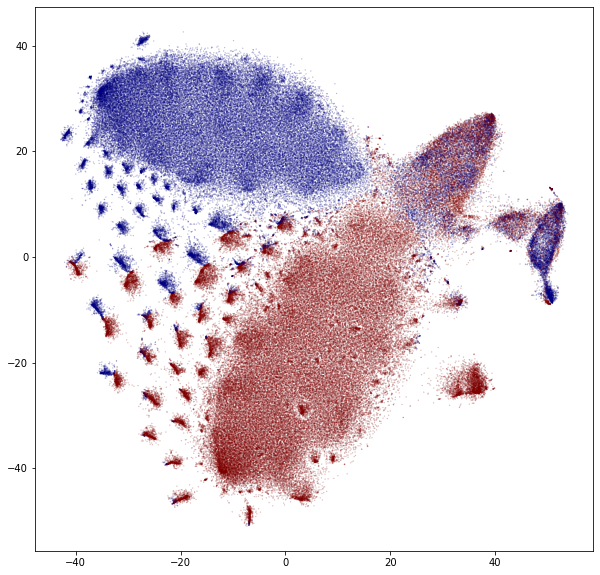

In [190]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = df_speeds.loc[df_wv_samples.index]['speed_MOUTH'] > 0, s = 0.05, alpha =0.5, cmap='jet')

In [55]:
mean_speeds = df_speeds.loc[df_wv_samples.index].mean(axis=1)
mean_ventral_speeds = df_speeds.loc[df_wv_samples.index].filter(like='VTP').mean(axis=1)

In [56]:
mean_speeds

5519156    1.001481
1875157    0.411762
1104935    0.936172
6358171    0.849809
371452     0.678239
             ...   
3207603    0.710548
2735098    0.462044
4312415    0.741789
5324952    0.986923
4454841    0.537845
Length: 200000, dtype: float64

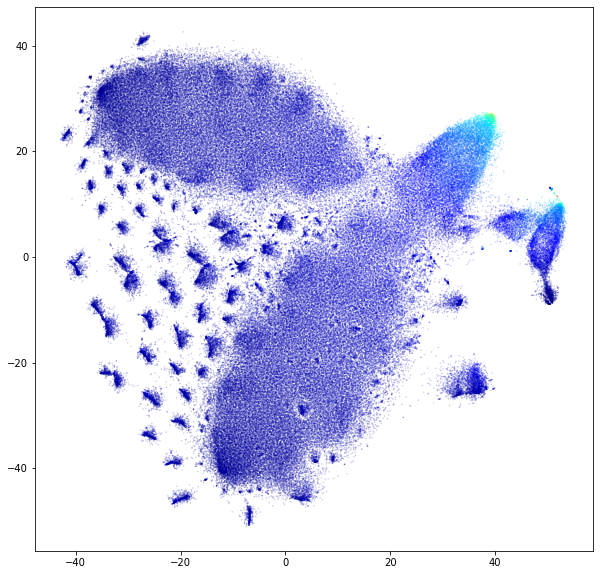

In [57]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = mean_speeds, s = 0.05, alpha =0.5, cmap='jet')

In [442]:
from sklearn.preprocessing import Normalizer

In [459]:
mean_dorsal_speeds = df_speeds.loc[df_wv_samples.index].filter(like='DT').mean(axis=1)

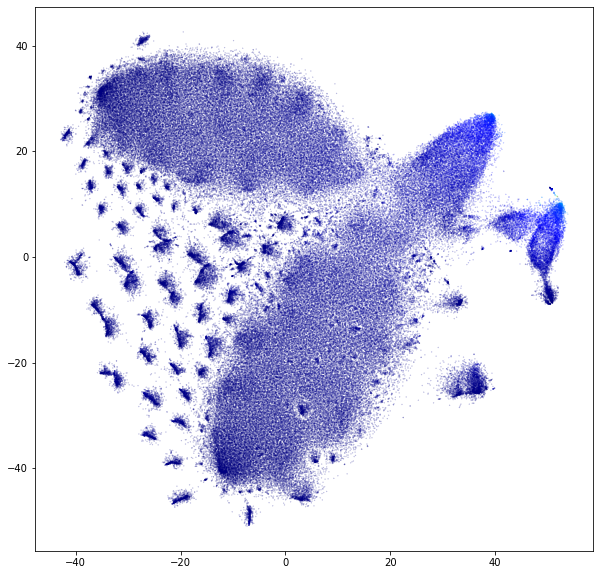

In [651]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = mean_dorsal_speeds, s = 0.05, alpha =0.5, cmap='jet')

In [460]:
norm_mean_speeds = np.log(mean_dorsal_speeds.values.reshape((-1,1))).reshape((-1,))

In [461]:
norm_mean_speeds.shape

(200000,)

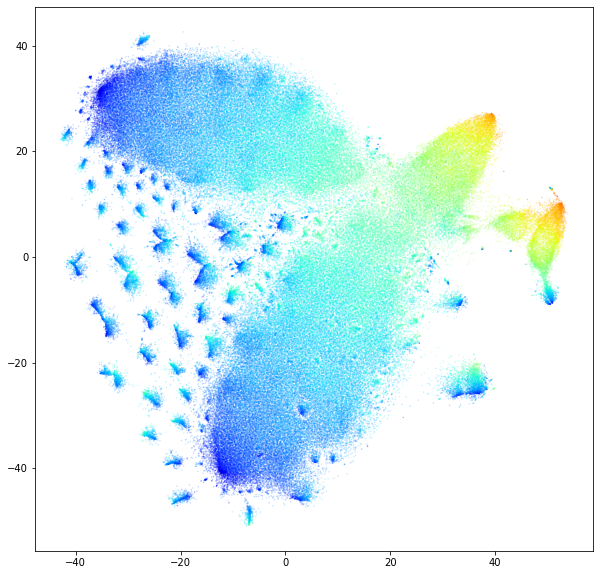

In [462]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = norm_mean_speeds, s = 0.05, alpha =0.5, cmap='jet')

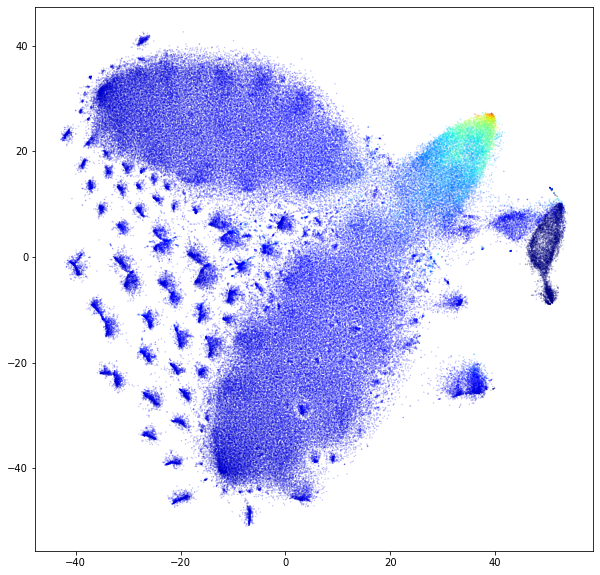

In [58]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2[:,0], embedding2[:,1], c = mean_ventral_speeds, s = 0.05, alpha =0.5, cmap='jet')

# Curvatures : spatiotemporal (wavelets)

In [355]:
df_wv1 = pd.read_pickle('/data/temp/athira/wavelet_array_for_tsne_testing.pickle')

In [357]:
df_wv1_samples = df_wv1.loc[df_wv_samples.index]

In [358]:
%%time
affinities_annealing_ = affinity.PerplexityBasedNN(
    df_wv1_samples.values,
    perplexity= 500,
    metric="euclidean",
    n_jobs= 46,
    random_state=3,
    method = 'exact'
)

CPU times: user 1d 5h 49min 21s, sys: 3min 18s, total: 1d 5h 52min 39s
Wall time: 50min 15s


In [359]:
%time init_ = initialization.pca(df_wv1_samples.values, random_state=42)

CPU times: user 1.27 s, sys: 67.9 ms, total: 1.34 s
Wall time: 1.34 s


In [360]:
embedding_ = TSNEEmbedding(
    init_,
    affinities_annealing_,
    negative_gradient_method="fft",
    n_jobs= 46,
    
)

In [361]:
%%time 
embedding1_ = embedding_.optimize(n_iter=250, exaggeration=12, momentum=0.5)

CPU times: user 50min 13s, sys: 1.62 s, total: 50min 15s
Wall time: 1min 13s


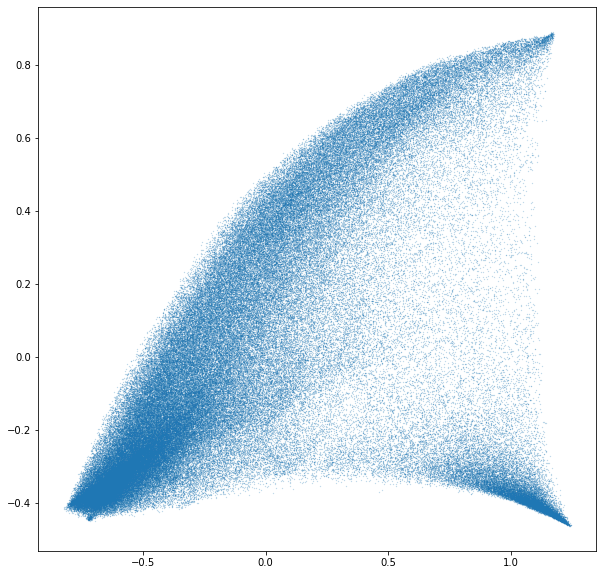

In [362]:
fig, axes = plt.subplots(1,1, figsize = (10,10))

axes.scatter(embedding1_[:,0], embedding1_[:,1], s = 0.05, alpha =0.5)

In [363]:
%time embedding2_ = embedding1_.optimize(n_iter=750, exaggeration=1, momentum=0.8)

CPU times: user 2h 24min, sys: 5.42 s, total: 2h 24min 5s
Wall time: 3min 42s


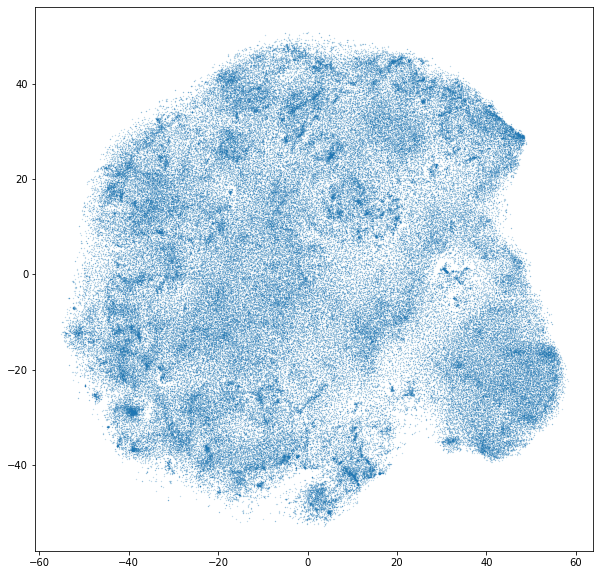

In [364]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding2_[:,0], embedding2_[:,1], s = 0.05, alpha =0.5)

In [365]:
%time affinities_annealing_.set_perplexity(250)

CPU times: user 1min 48s, sys: 2.12 s, total: 1min 51s
Wall time: 12.8 s


In [366]:
%time embedding3_ = embedding2_.optimize(n_iter=500, momentum=0.8, exaggeration=2)

CPU times: user 56min 46s, sys: 2.49 s, total: 56min 49s
Wall time: 1min 32s


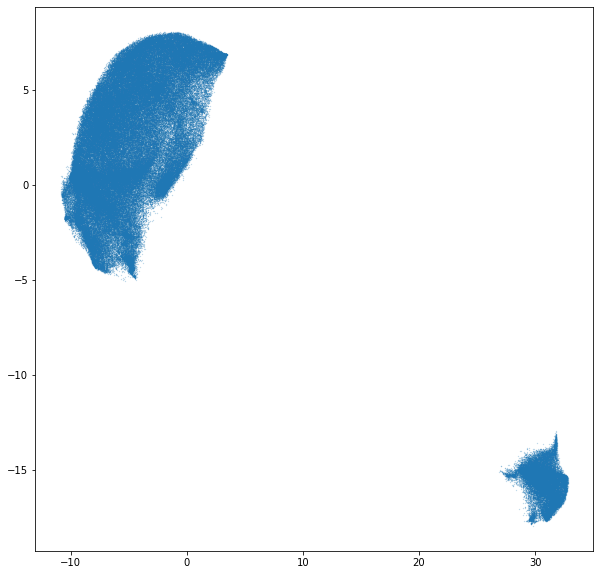

In [367]:
fig, axes = plt.subplots(1,1, figsize = (10,10))
axes.scatter(embedding3_[:,0], embedding3_[:,1], s = 0.05, alpha =0.5)

# DBSCAN

In [59]:
from sklearn.cluster import DBSCAN

In [123]:
clus_in = embedding3

clustering = DBSCAN(eps = 1, min_samples= 20, n_jobs=40).fit(clus_in)
print(clustering.labels_.max())

10


In [138]:
label_map_db = {}
for i, label in enumerate(np.unique(clustering.labels_)):
    label_map_db[label] = i

c_pal_db = sns.color_palette('tab10',len(np.unique(clustering.labels_))+1)

colors_db = [c_pal_db[label_map_db[label]] for label in clustering.labels_]

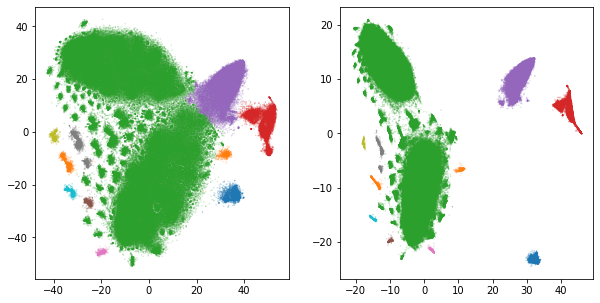

In [139]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_db)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_db)

## DBSCAn with MOUTH

In [398]:
bool_MOUTH = (df_speeds.loc[df_wv_samples.index]['speed_MOUTH']>0)

In [399]:
bool_MOUTH = bool_MOUTH.values.reshape((-1,1)) 

In [373]:
bool_MOUTH = bool_MOUTH * 0.01

In [391]:
bool_MOUTH

array([[0.01],
       [0.  ],
       [0.  ],
       ...,
       [0.  ],
       [0.  ],
       [0.  ]])

In [375]:
from sklearn.preprocessing import MinMaxScaler

In [377]:
scaled_embedding3_ = MinMaxScaler().fit_transform(embedding3_)

In [400]:
clus_in_m = np.hstack([embedding3, bool_MOUTH, embedding3_])
clustering_m = DBSCAN(eps = 1.5, min_samples= 100, n_jobs=40).fit(clus_in_m)
print(clustering_m.labels_.max())

27


In [401]:
label_map_db_m = {}
for i, label in enumerate(np.unique(clustering_m.labels_)):
    label_map_db_m[label] = i

c_pal_db_m = sns.color_palette('tab10',len(np.unique(clustering_m.labels_))+1)

colors_db_m = [c_pal_db_m[label_map_db_m[label]] for label in clustering_m.labels_]

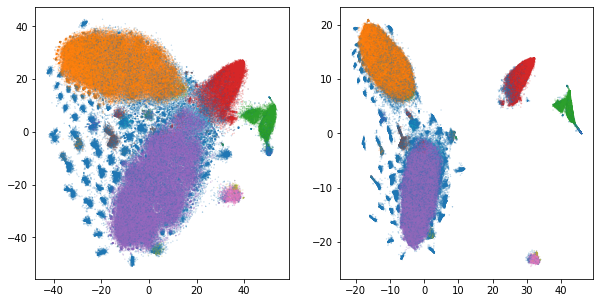

In [402]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_db_m)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_db_m)

# HDBSCAN

In [129]:
import hdbscan

In [162]:
clusterer = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 1000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon= 0.1,
    cluster_selection_method='leaf',
    prediction_data=True, 
    )

In [163]:
labels_hdbscan = clusterer.fit_predict(clus_in)

In [166]:
np.unique(labels_hdbscan)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [167]:
label_map_hdb = {}
for i, label in enumerate(np.unique(labels_hdbscan)):
    label_map_hdb[label] = i

c_pal_hdb = sns.color_palette('tab20',len(np.unique(labels_hdbscan))+1)

colors_hdb = [c_pal_hdb[label_map_hdb[label]] for label in labels_hdbscan]

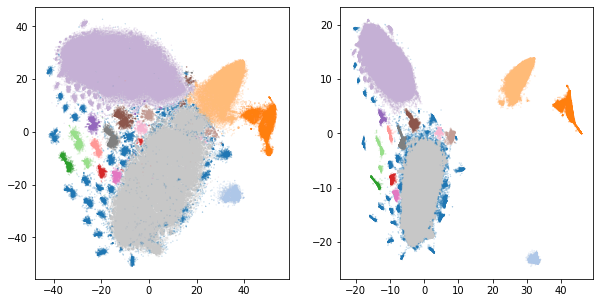

In [168]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_hdb)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_hdb)

## with MOUTH

In [403]:
clusterer_m = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 2000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon= 0.5,
#     cluster_selection_method='leaf',
    prediction_data=True, 
    )

In [404]:
labels_hdbscan_m = clusterer_m.fit_predict(clus_in_m)

In [405]:
np.unique(labels_hdbscan_m)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [406]:
label_map_hdb_m = {}
for i, label in enumerate(np.unique(labels_hdbscan_m)):
    label_map_hdb_m[label] = i

c_pal_hdb_m = sns.color_palette('tab10',len(np.unique(labels_hdbscan_m))+1)

colors_hdb_m = [c_pal_hdb_m[label_map_hdb_m[label]] for label in labels_hdbscan_m]

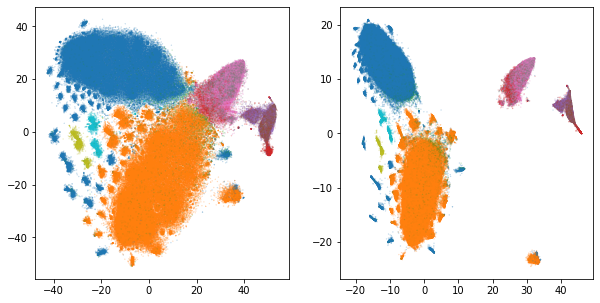

In [407]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_hdb_m)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_hdb_m)

## custom embedding

In [761]:
clusterer_m2 = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 2000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon= 1,
#     cluster_selection_method='leaf',
    prediction_data=True, 
    )

In [762]:
labels_hdbscan_m2 = clusterer_m2.fit_predict(clus_in_m2)

In [763]:
np.unique(labels_hdbscan_m2)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9])

In [764]:
label_m2ap_hdb_m2 = {}
for i, label in enumerate(np.unique(labels_hdbscan_m2)):
    label_m2ap_hdb_m2[label] = i

c_pal_hdb_m2 = sns.color_palette('tab10',len(np.unique(labels_hdbscan_m2))+1)

colors_hdb_m2 = [c_pal_hdb_m2[label_m2ap_hdb_m2[label]] for label in labels_hdbscan_m2]

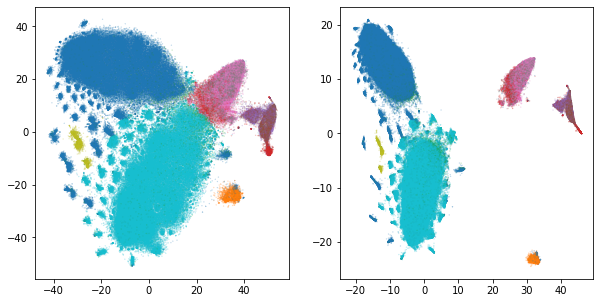

In [765]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_hdb_m2)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_hdb_m2)

# GMM

In [169]:
from sklearn.mixture import BayesianGaussianMixture

In [191]:
bgm = BayesianGaussianMixture(n_components=6, random_state=42, covariance_type='tied', 
                              weight_concentration_prior_type="dirichlet_process",
                              weight_concentration_prior=100,
                              max_iter=1500
                             )

In [192]:
clusters_bgm = bgm.fit_predict(clus_in)

In [193]:
np.unique(clusters_bgm)

array([0, 1, 2, 3, 4, 5])

In [194]:
label_map_bgm = {}
for i, label in enumerate(np.unique(clusters_bgm)):
    label_map_bgm[label] = i

c_pal_bgm = sns.color_palette('tab10',len(np.unique(clusters_bgm))+1)

colors_bgm = [c_pal_bgm[label_map_bgm[label]] for label in clusters_bgm]

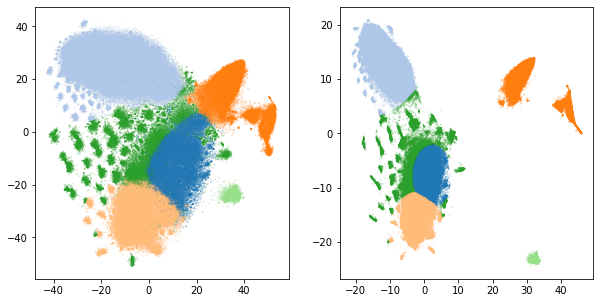

In [195]:
fig, axes = plt.subplots(1, 2, figsize = (10,5))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.05, alpha =0.5, c = colors_bgm)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_bgm)

## with MOUTH

In [503]:
bgm_m = BayesianGaussianMixture(n_components=10, random_state=42, covariance_type='diag', 
                              weight_concentration_prior_type="dirichlet_process",
                              weight_concentration_prior=1,
                              max_iter=1500
                             )

In [504]:
clusters_bgm_m = bgm_m.fit_predict(clus_in_m)

In [505]:
np.unique(clusters_bgm_m)

array([1, 2, 3, 4, 5, 6, 7, 8])

In [506]:
label_map_bgm_m = {}
for i, label in enumerate(np.unique(clusters_bgm_m)):
    label_map_bgm_m[label] = i

c_pal_bgm_m = sns.color_palette('tab10',len(np.unique(clusters_bgm_m))+1)

colors_bgm_m = [c_pal_bgm_m[label_map_bgm_m[label]] for label in clusters_bgm_m]

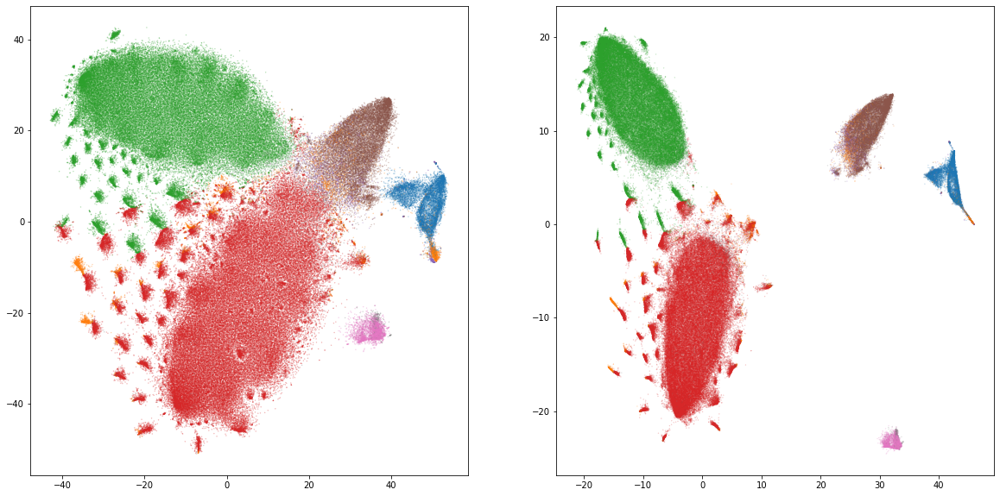

In [507]:
fig, axes = plt.subplots(1, 2, figsize = (20,10))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.1, alpha =0.5, c = colors_bgm_m)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_bgm_m)

## Speed and curv

In [492]:
bgm_sc = BayesianGaussianMixture(n_components=8, random_state=42, covariance_type='full', 
                              weight_concentration_prior_type="dirichlet_process",
                              weight_concentration_prior=1,
                              max_iter=1500
                             )

In [493]:
clus_in_sc = np.hstack([embedding3, embedding3_])

In [494]:
clusters_bgm_sc = bgm_sc.fit_predict(clus_in_sc)

In [495]:
np.unique(clusters_bgm_sc)

array([0, 1, 2, 3, 4, 5, 6, 7])

In [496]:
label_scap_bgm_sc = {}
for i, label in enumerate(np.unique(clusters_bgm_sc)):
    label_scap_bgm_sc[label] = i

c_pal_bgm_sc = sns.color_palette('tab10',len(np.unique(clusters_bgm_sc))+1)

colors_bgm_sc = [c_pal_bgm_sc[label_scap_bgm_sc[label]] for label in clusters_bgm_sc]

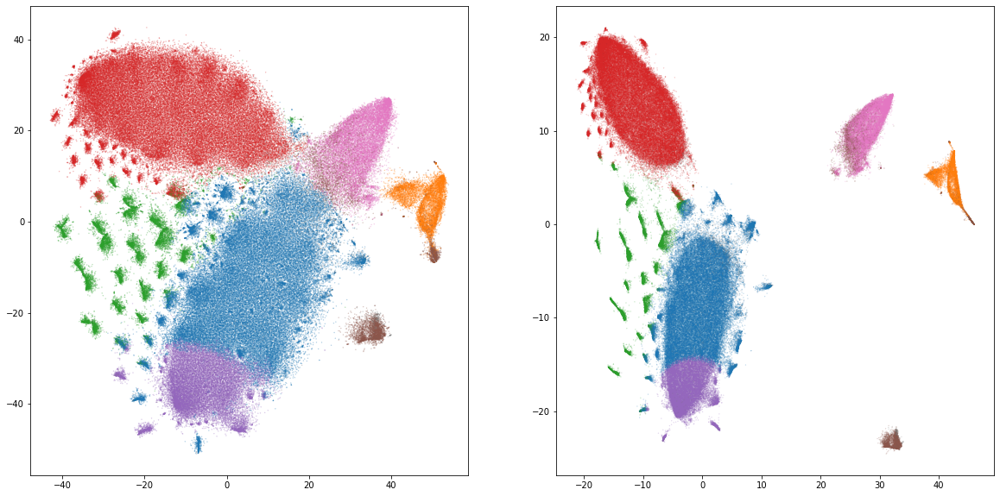

In [497]:
fig, axes = plt.subplots(1, 2, figsize = (20,10))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.1, alpha =0.5, c = colors_bgm_sc)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_bgm_sc)

## Custom emedding

In [749]:
bgm_m2 = BayesianGaussianMixture(n_components=8, random_state=42, covariance_type='full', 
                              weight_concentration_prior_type="dirichlet_process",
                              weight_concentration_prior=1,
                              max_iter=1500
                             )

In [750]:
speed_MOUTH = df_speeds.loc[df_wv_samples.index]['speed_MOUTH'].values.reshape((-1,1))
speed_dorsal = MinMaxScaler().fit_transform(mean_dorsal_speeds.values.reshape((-1,1)))
speed_ventral = MinMaxScaler().fit_transform(mean_ventral_speeds.values.reshape((-1,1)))

In [751]:
clus_in_m2 = np.hstack([embedding3, bool_MOUTH, speed_log, speed_MOUTH, speed_ventral, embedding3_])

In [752]:
clusters_bgm_m2 = bgm_m2.fit_predict(clus_in_m2)

In [753]:
np.unique(clusters_bgm_m2)

array([0, 1, 2, 3, 4, 5, 6, 7])

In [754]:
label_m2ap_bgm_m2 = {}
for i, label in enumerate(np.unique(clusters_bgm_m2)):
    label_m2ap_bgm_m2[label] = i

c_pal_bgm_m2 = sns.color_palette('tab10',len(np.unique(clusters_bgm_m2))+1)

colors_bgm_m2 = [c_pal_bgm_m2[label_m2ap_bgm_m2[label]] for label in clusters_bgm_m2]

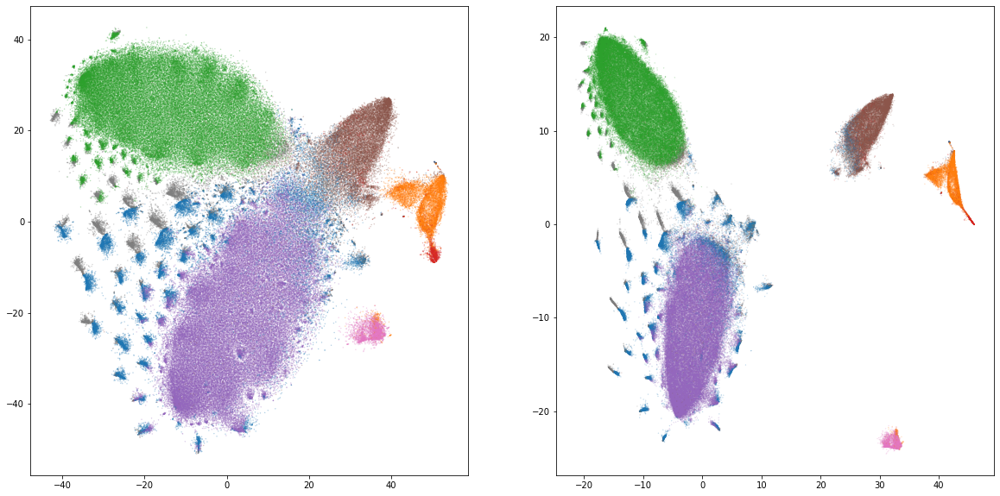

In [755]:
fig, axes = plt.subplots(1, 2, figsize = (20,10))
axes = axes.ravel()
axes[0].scatter(embedding2[:,0], embedding2[:,1], s = 0.1, alpha =0.5, c = colors_bgm_m2)
axes[1].scatter(embedding3[:,0], embedding3[:,1], s = 0.05, alpha =0.5, c = colors_bgm_m2)

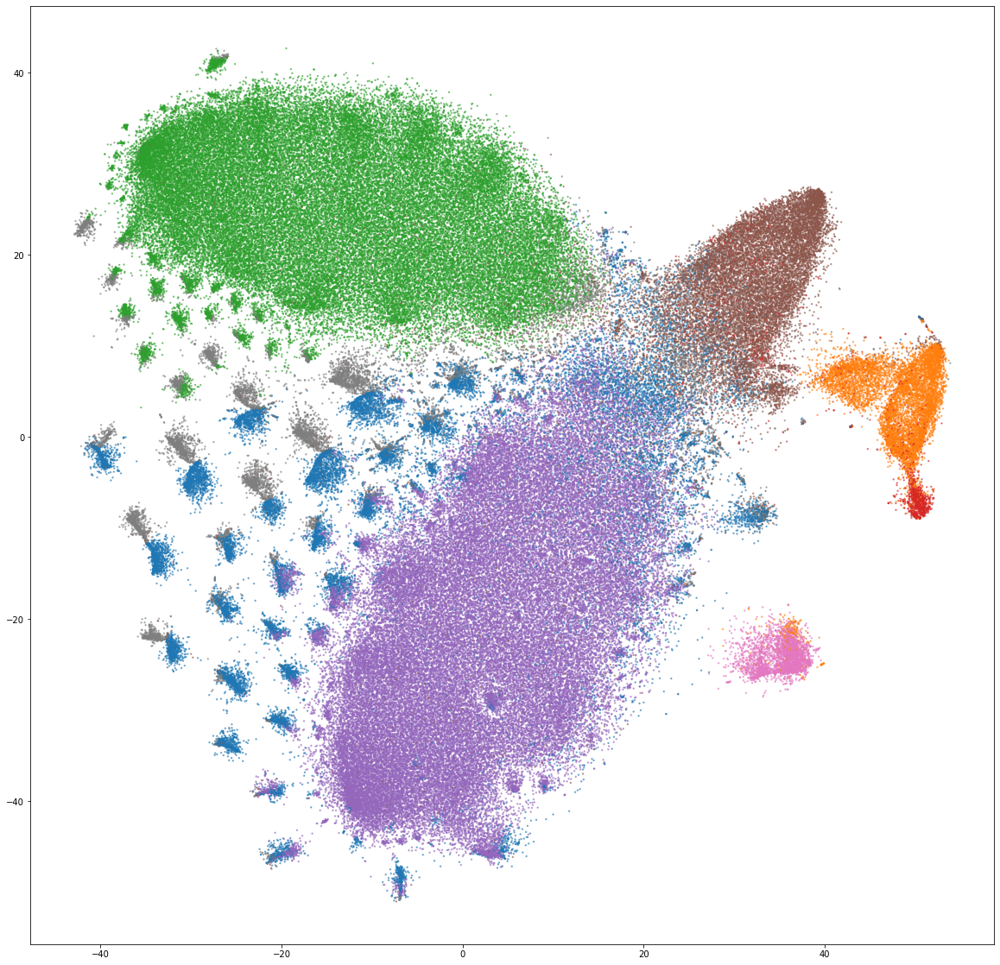

In [768]:
fig, axes = plt.subplots(1, 1, figsize = (20,20))
axes.scatter(embedding2[:,0], embedding2[:,1], s = 2, alpha =0.5, c = colors_bgm_m2)

# Tracking back

In [774]:
df = pd.read_hdf('/work/athira/behavior_projects/behavior_amphioxus/results/featureset_v5_08082023.h5', key='features')

In [775]:
df_sampled_feats = df.loc[df_wv_samples.index]
df_sampled_feats.shape

(200000, 50)

In [776]:
df_sampled_feats.columns

Index(['len_NT_to_TT', 'len_sum_of_parts', 'len_mean_of_parts', 'curv_NT',
       'curv_DH1', 'curv_DH2', 'curv_DNP', 'curv_DTP1', 'curv_DTP2',
       'curv_DTP3', 'curv_DTP4', 'curv_DTP5', 'curv_DTP6', 'curv_DTP7',
       'curv_DTP8', 'curv_DTP9', 'curv_DTP10', 'curv_TT', 'quirkiness',
       'speed_NT', 'speed_DH1', 'speed_DH2', 'speed_DNP', 'speed_DTP1',
       'speed_DTP2', 'speed_DTP3', 'speed_DTP4', 'speed_DTP5', 'speed_DTP6',
       'speed_DTP7', 'speed_DTP8', 'speed_DTP9', 'speed_DTP10', 'speed_TT',
       'speed_VTP10', 'speed_VTP9', 'speed_VTP8', 'speed_VTP7', 'speed_VTP6',
       'speed_VTP5', 'speed_VTP4', 'speed_VTP3', 'speed_VTP2', 'speed_VTP1',
       'speed_VNP', 'len_sum_of_parts_V', 'speed_MOUTH', 'MOUTH', 'filename',
       'frame'],
      dtype='object')

In [777]:
results_df = pd.DataFrame(index=df_wv_samples.index, columns=['clusters_custom_bgm', 'clusters_bgm', 'filename', 'frame'])

In [778]:
results_df['clusters_custom_bgm'] = clusters_bgm_m2

In [779]:
results_df['clusters_bgm'] = clusters_bgm_m

In [780]:
results_df['filename'] = df_sampled_feats['filename']
results_df['frame'] = df_sampled_feats['frame']

In [781]:
results_df

,clusters_custom_bgm,clusters_bgm,filename,frame
5519156,0,4,20180724_180559_1_15m0s_None_None_None_INVERTED,22861
1875157,2,3,20180721_164249_1_15m0s_SNAP-5114_None_None_IN...,7375
1104935,2,3,20180720_170953_1_15m0s_None_None_None_INVERTED,22908
6358171,7,3,20180727_125612_1_5m0s_Dihydrokainic acid_None...,1045
371452,0,4,20180720_111822_1_15m0s_None_None_None_INVERTED,21529
...,...,...,...,...
3207603,6,7,20180723_093242_1_5m0s_None_None_None_INVERTED,1961
2735098,0,4,20180722_153628_1_15m0s_None_None_None_INVERTED,1189
4312415,2,3,20180724_101920_1_5m0s_Dihydrokainic acid_None...,6038
5324952,2,3,20180724_164132_1_5m0s_None_None_None_INVERTED,7006


In [805]:
results_df.to_pickle('/data/temp/athira/tsne_gmm_amphi_results_27082023.pickle')

In [784]:
combined_df = pd.concat([df_sampled_feats, results_df.filter(like='clusters')], axis=1)

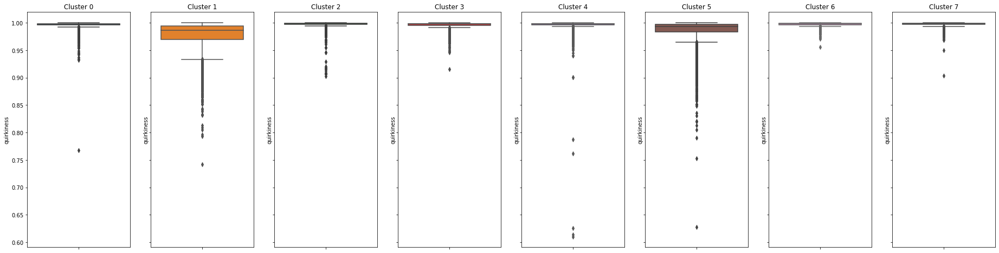

In [800]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    sns.boxplot(data=group, y='quirkiness', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

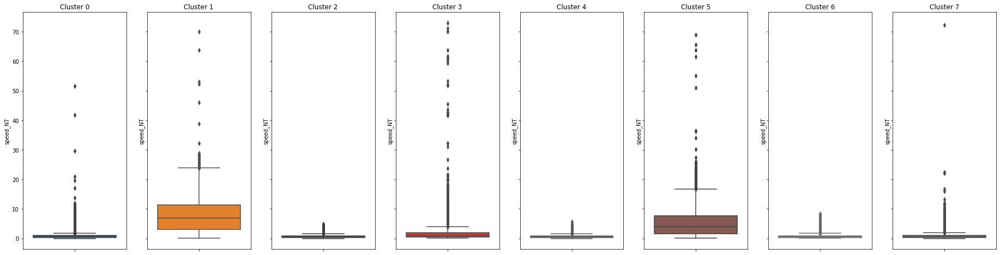

In [799]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    sns.boxplot(data=group, y='speed_NT', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

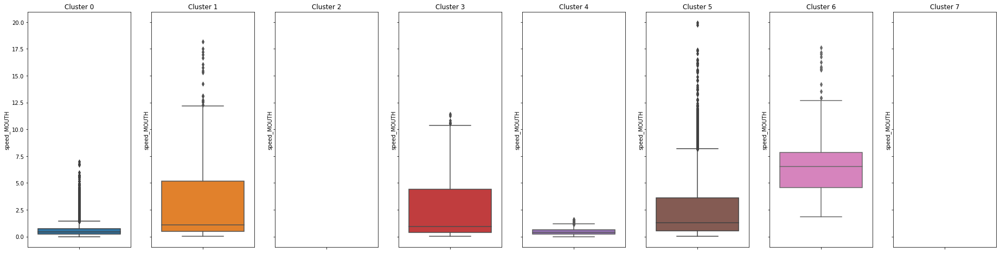

In [801]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    sns.boxplot(data=group, y='speed_MOUTH', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

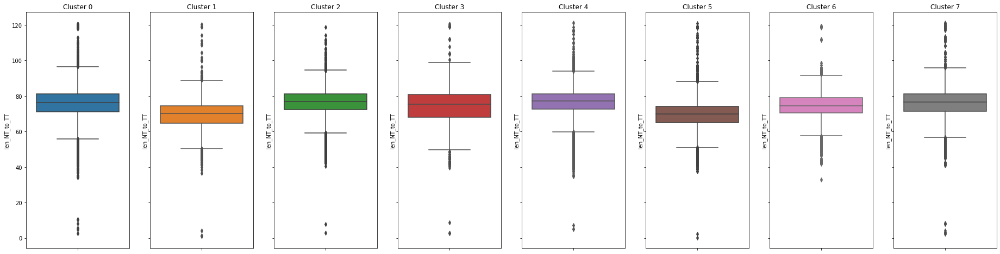

In [802]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    sns.boxplot(data=group, y='len_NT_to_TT', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

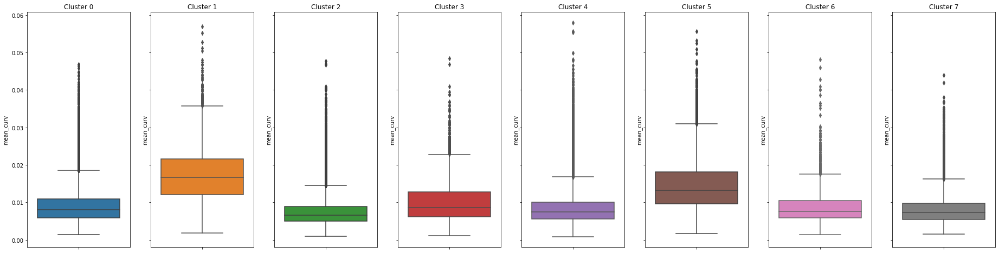

In [803]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    group['mean_curv'] = group.filter(like='curv').abs().mean(axis=1)
    sns.boxplot(data=group, y='mean_curv', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

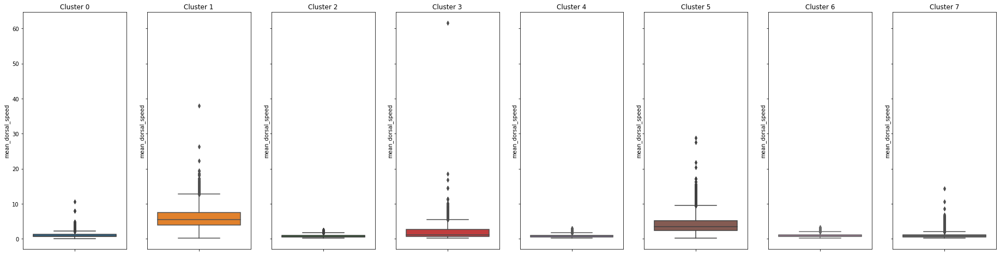

In [804]:
fig, axes = plt.subplots(1,8, figsize=(32,8), sharex=True, sharey=True)
axes = axes.ravel()
grouped_ = combined_df.groupby('clusters_custom_bgm')
for i, (cluster, group) in enumerate(grouped_):
    group['mean_dorsal_speed'] = group.filter(like='speed_DT').abs().mean(axis=1)
    sns.boxplot(data=group, y='mean_dorsal_speed', ax=axes[i], color=c_pal_bgm_m2[cluster])
    axes[i].set_title(f'Cluster {cluster}')

In [806]:
import pickle

In [807]:
pickle.dump(embedding2, open('/data/temp/athira/TSNE_embedding2_200k_speeds.tsne', 'wb'))
pickle.dump(embedding3, open('/data/temp/athira/TSNE_embedding3_200k_speeds.tsne', 'wb'))

In [808]:
pickle.dump(embedding2_, open('/data/temp/athira/TSNE_embedding2_200k_wavelets.tsne', 'wb'))
pickle.dump(embedding3_, open('/data/temp/athira/TSNE_embedding3_200k_wavelets.tsne', 'wb'))